# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this project, we use deep learning to classify German traffic signs.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

training_file = './data/train.p'
testing_file = './data/test.p'

with open(training_file, mode='rb') as f:
    data_train_n_validation = pickle.load(f)
with open(testing_file, mode='rb') as f:
    data_test = pickle.load(f)

X_trainvalid, y_trainvalid = data_train_n_validation['features'], data_train_n_validation['labels']
X_test, y_test = data_test['features'], data_test['labels']

#size_trainvalid, coord_trainvalid = data_train_n_validation['sizes'], data_train_n_validation['coords']

# train and validation sets (both are shuffled in the process)
#X_train, X_validation, y_train, y_validation, size_train, size_valid, coord_train, coord_valid \
#   = train_test_split(X_trainvalid, y_trainvalid, size_trainvalid, coord_trainvalid, \
#                      test_size=0.20, random_state=42)

print('data loaded')

data loaded


### Split (augmented) data into training (80%) and validation (20%) set randomly.

In [2]:
# Extract data into train, validation and test sets    
from sklearn.model_selection import train_test_split

# train and validation sets (both are shuffled in the process)
#X_train, X_validation, y_train, y_validation \
#   = train_test_split(X_trainvalid_ext, y_trainvalid_ext, \
#                      test_size=0.10, random_state=42)
X_train, X_validation, y_train, y_validation \
   = train_test_split(X_trainvalid, y_trainvalid, \
                      test_size=0.20, random_state=42)
    
assert(len(X_train) == len(y_train))
assert(len(X_validation) == len(y_validation))
assert(len(X_test) == len(y_test))

### Read sign names from csv

In [3]:
# Read sign names from csv file
from pandas.io.parsers import read_csv
signnames = read_csv("signnames.csv").values[:, 1]

---

## Step 1: Dataset Summary & Exploration

In [4]:
# Number of training examples
n_train = X_train.shape[0]

# Number of training examples
n_validation = X_validation.shape[0]

# Number of testing examples.
n_test = X_test.shape[0]

# What's the shape of an traffic sign image?
image_shape = X_train[0].shape

# How many unique classes/labels there are in the dataset.
n_classes = max(y_train)+1

print("Number of training examples =", n_train)
print("Number of validation examples =", n_validation)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 31367
Number of validation examples = 7842
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


## Visualize the German Traffic Signs Dataset 
### a. Count number of images of each label and display the first image.

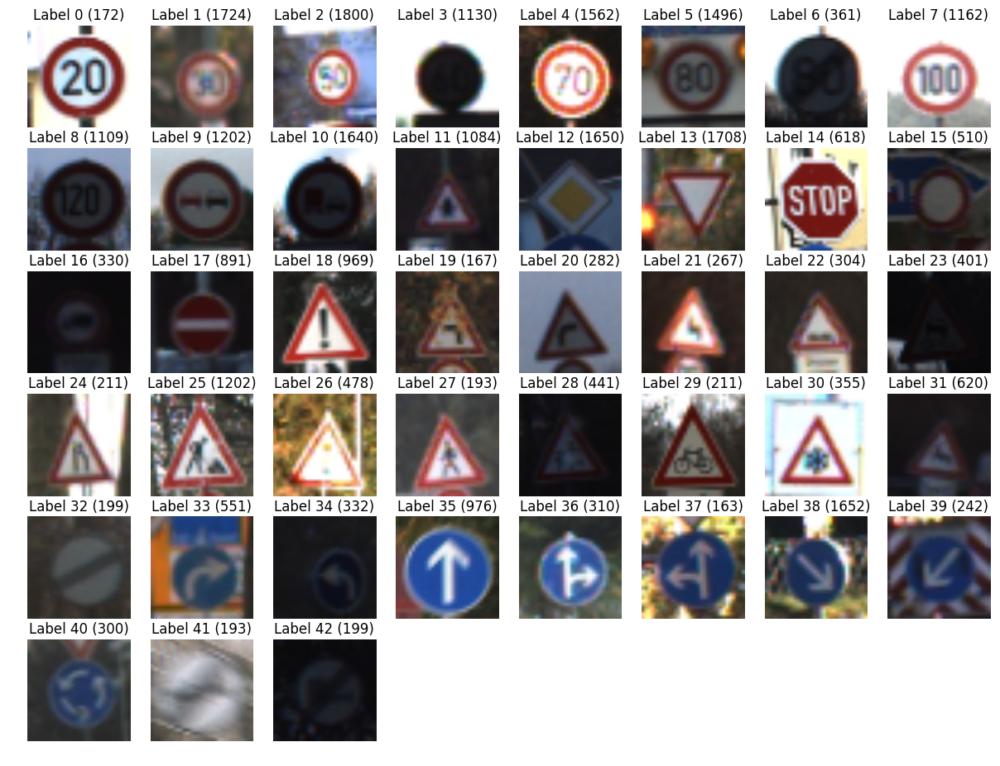

In [5]:
import matplotlib.pyplot as plt
import numpy as np

def get_sample_images(X, y, plotfig=False):

    labels = y.tolist()
    unique_labels = set(labels)
    X_samples = []
    y_samples = []
    for label in unique_labels:
        # Pick the first image for each label.
        image = X[labels.index(label)]
        X_samples.append(image)
        y_samples.append(label)
    
    X_samples = np.asarray(X_samples)
    y_samples = np.asarray(y_samples)
    
    if plotfig:
        # plot sample images
        plt.figure(figsize=(15, 15))
        for i in range(X_samples.shape[0]):
            image = X_samples[i].squeeze()
            plt.subplot(8, 8, i+1)  # A grid of 8 rows x 8 columns
            plt.axis('off')
            plt.title("Label {0} ({1})".format(i, labels.count(i)))
            plt.imshow(image)

        plt.show()    

    return X_samples, y_samples

X_samples, y_samples = get_sample_images(X_train, y_train, True)

The images look good. They are resized to a square correctly, with the signs occupying most of the image area and generally centered. We also have a variety of lighting conditions and image quality.

The count for each type seems to vary quite a bit, some classes have as few as 100+ images, which may not be enough to train an accurate model. Let's plot the histogram to have a look.

### b. Histogram of dataset

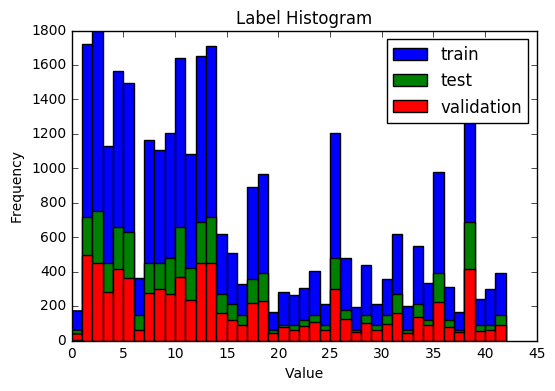

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Visualizations will be shown in the notebook.
%matplotlib inline

plt.hist(y_train,range(n_classes),label='train')
plt.hist(y_test,range(n_classes),label='test')
plt.hist(y_validation,range(n_classes),label='validation')

plt.xlabel("Value")
plt.ylabel("Frequency")
plt.title("Label Histogram")
plt.legend()


All three sets have roughly the same distribution. 
Thoughts:
1. Signs with lower counts (rare) in training set will not be as accurately trained as those with higher counts (common), i.e. less certain.
2. However, in the validation and test sets, we also have less of these "rare" signs, so performance might be unaffected.
3. If we generate arfiticial data to boost the training set (rotation, translation, enhance contrast etc) , should we 
   a) boost in the same proportion, i.e. main the distribution, aligned with the test sets, or
   b) water-fill, so that less frequent signs are "boosted", to improve accuracy of spotting a "rare" (maybe more important) sign?

----

## Step 2: Design and Test a Model Architecture

Here we design and implement a deep learning model that learns to recognize traffic signs.

### a. Pre-Process Images

Before we run the data through the neural network, we first pre-process the images to improve overall accuracy.

Firstly, we decide if we want to work with the 3-channel RGB images or gray scale. 

In [7]:
#Number of channels to process - 1:grayscale, 3:RGB
proc_num_channels = 3 

In [8]:
import cv2

def preprocess_grayscale(X):
    
    ## Grayscale
    X_gray = np.dot(X[...][...,:3],[0.299,0.587,0.114])

    ## Histogram Equalization (Improve contrast)
    X_gray_eq = np.zeros(shape=X_gray.shape)
    for i in range(X_gray.shape[0]):
        img = cv2.equalizeHist(X_gray[i].squeeze().astype(np.uint8))
        X_gray_eq[i] = img

    ## scale to [0,1]
    X_gray_eq_scale = np.divide(X_gray_eq,255.0)
    
    ## expand to fit dimensions
    X_prep = np.expand_dims(X_gray_eq_scale, axis=3) 
    
    return X_prep


def equalize_Y_channel(img):
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    
    # equalize the histogram of the Y channel
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])

    # convert the YUV image back to RGB format
    img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

    return img_output

def preprocess_rgb(X):

    ## Histogram Equalization (Improve contrast)
    X_eq = np.zeros(shape=X.shape)
    for i in range(X.shape[0]):
        img = X[i].squeeze().astype(np.uint8)
        X_eq[i] = equalize_Y_channel(img)

    ## scale to [0,1]
    X_eq_scale = np.divide(X_eq,255.0)
    
    return X_eq_scale

Random Test Label 8


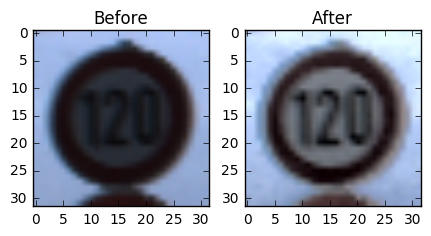

All pre-processing steps done.


In [9]:
import random

if (proc_num_channels==1):
    ## Pre-Process: Grayscale
    X_train_prep = preprocess_grayscale(X_train)
    X_validation_prep = preprocess_grayscale(X_validation)
    X_test_prep = preprocess_grayscale(X_test)
elif (proc_num_channels==3):
    ## Pre-Process: RGB
    X_train_prep = preprocess_rgb(X_train)
    X_validation_prep = preprocess_rgb(X_validation)
    X_test_prep = preprocess_rgb(X_test)
else:
    print('Please select ONLY 1 or 3 channels')
    
#print(X_train_prep.shape)    
# check random image in training set for improvement    
index = random.randint(0, len(X_train))
print("Random Test Label {0}".format(y_train[index]))
    
plt.figure(figsize=(5,5))

plt.subplot(1, 2, 1)
plt.imshow(X_train[index].squeeze())
plt.title("Before")

plt.subplot(1, 2, 2)
if (proc_num_channels==1):
    plt.imshow(X_train_prep[index].squeeze(), cmap="gray")
else:
    plt.imshow(X_train_prep[index].squeeze())
plt.title("After")

plt.show()


print('All pre-processing steps done.')

Sample images look ok, image seems to be visually better than before pre-processing, at least to the human eye. Replace training data with preprocessed images

In [10]:
# replace data with preprocessed images
X_train = X_train_prep
X_validation = X_validation_prep
X_test = X_test_prep

print('All pre-processing done.')

All pre-processing done.


### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

**Answer:**

To convert to grayscale, we simply combine the weighted R,G,and B channels `Y = 0.299R + 0.587G + 0.114B`

For both grayscale and RGB options, we employ standard histogram equalization techniques to improve the contrast, so that features are more obvious. For RGB data, we first convert the images from RGB to YUV and perform histogram equalization on the Y-channel.

Finally, we scale all data to [0,1].

### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

**Answer:**

The training data was then split into training (80%) and validation (20%) sets using the 'train_test_split' function from sklearn, which shuffles the data in the process.

Test set was read from the German Traffic Sign Dataset without modification.

For the future: 

Data may be augmented by generating additional data from the original training set as follows:
- for each image, rotate the image randomly between -20 and +20 degrees, and 
- shift randomly between -3 and +3 pixels in both x and y directions.


### b. Design Deep Learning Model

Here we design and implement our deep learning model to recognize the traffic signs in the test dataset.

We start with the basic architecture of the LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81).



In [11]:
### Define your architecture here.
### Feel free to use as many code cells as needed.

import tensorflow as tf

EPOCHS = 50
BATCH_SIZE = 128

In [12]:
from tensorflow.contrib.layers import flatten

NChannels = proc_num_channels

def LeNet(x):    
    # Hyperparameters
    mu = 0
    sigma = 0.1
    
    # Layer 1: Convolutional. Input = 32x32x1. Output = 28x28x6.
    conv1_W = tf.Variable(tf.truncated_normal(shape=(5, 5, NChannels, 32), mean = mu, stddev = sigma))
    #conv1_W = tf.Variable(tf.truncated_normal(shape=(5, 5, 1, 6), mean = mu, stddev = sigma))
    conv1_b = tf.Variable(tf.zeros(32))
    conv1   = tf.nn.conv2d(x, conv1_W, strides=[1, 1, 1, 1], padding='VALID') + conv1_b

    # Activation.
    conv1 = tf.nn.relu(conv1)

    # Pooling. Input = 28x28x6. Output = 14x14x6.
    conv1 = tf.nn.max_pool(conv1, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    #conv1 = tf.nn.avg_pool(conv1, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')

    # Layer 2: Convolutional. Output = 10x10x16.
    #conv2_W = tf.Variable(tf.truncated_normal(shape=(5, 5, 6, 16), mean = mu, stddev = sigma))
    conv2_W = tf.Variable(tf.truncated_normal(shape=(5, 5, 32, 16), mean = mu, stddev = sigma))
    conv2_b = tf.Variable(tf.zeros(16))
    conv2   = tf.nn.conv2d(conv1, conv2_W, strides=[1, 1, 1, 1], padding='VALID') + conv2_b
    
    # Activation.
    conv2 = tf.nn.relu(conv2)

    # Pooling. Input = 10x10x16. Output = 5x5x16.
    conv2 = tf.nn.max_pool(conv2, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    #conv2 = tf.nn.avg_pool(conv2, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')

    # Flatten. Input = 5x5x16. Output = 400.
    fc0   = flatten(conv2)
    
    # Layer 3: Fully Connected. Input = 400. Output = 120.
    fc1_W = tf.Variable(tf.truncated_normal(shape=(400, 120), mean = mu, stddev = sigma))
    fc1_b = tf.Variable(tf.zeros(120))
    fc1   = tf.matmul(fc0, fc1_W) + fc1_b
    
    # Activation.
    fc1    = tf.nn.relu(fc1)

    # dropout
    #fc1_drop = tf.nn.dropout(fc1, keep_prob)
    
    # Layer 4: Fully Connected. Input = 120. Output = 84.
    fc2_W  = tf.Variable(tf.truncated_normal(shape=(120, 84), mean = mu, stddev = sigma))
    fc2_b  = tf.Variable(tf.zeros(84))
    #fc2    = tf.matmul(fc1_drop, fc2_W) + fc2_b # with drop-out
    fc2    = tf.matmul(fc1, fc2_W) + fc2_b # no drop-out
    
    # Activation.
    fc2    = tf.nn.relu(fc2)
    
    # dropout
    fc2_drop = tf.nn.dropout(fc2, keep_prob)

    # Layer 5: Fully Connected. Input = 84. Output = n_classes.
    fc3_W  = tf.Variable(tf.truncated_normal(shape=(84, n_classes), mean = mu, stddev = sigma))
    fc3_b  = tf.Variable(tf.zeros(n_classes))
    logits = tf.matmul(fc2_drop, fc3_W) + fc3_b # with drop-out
    #logits = tf.matmul(fc2, fc3_W) + fc3_b # no drop-out
    
    # For L2-regularization
    l2loss_hidden_weights = tf.nn.l2_loss(fc2_W)
    l2loss_out_weights = tf.nn.l2_loss(fc3_W)
    
    return logits, l2loss_hidden_weights, l2loss_out_weights

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**

The final architecture is similar to the baseline LeNet architecture. It consists of two convolutional networks followed by two fully connected layers.

The original LeNet uses single channel gray-scale images to recognize monochrome handwritten sympbols. In the first layer, I increase the number of input channels to 3 to accomodate the RGB pre-processed images. 

I also increase the features for the input CNN layer from 6 to 32. While 6 may be sufficient for monochrome symbols, colored traffic signs with different shapes, lighting and background may require more features. The second layer collapse the 32 features into 16.

In order to prevent over-fitting, I added drop-out to the final output layer, with keep probability 0.4.

max pooling is used to reduce the input data. average pooling did not give better results.  

Finally L2-regulaization is added, by adding the L2-norm of the weights to the loss, with a beta-factor 0.0001. This is achieved with tensorflow's l2_loss function. (Note: do not apply L2 regularization on biases).

In [13]:
### Train your model here.
### Feel free to use as many code cells as needed.
x = tf.placeholder(tf.float32, (None, 32, 32, NChannels)) # 3-channel RGB images
#x = tf.placeholder(tf.float32, (None, 32, 32, 1)) # gray-scale images
y = tf.placeholder(tf.int32, (None))
one_hot_y = tf.one_hot(y, n_classes)

# dropout keep probability
keep_prob = tf.placeholder(tf.float32)

In [14]:
rate = 0.001
beta = 0.0001 # for L2 regularization - 0.0=turn off

#logits = LeNet(x)
logits, l2loss_hidden_weights, l2loss_out_weights = LeNet(x)
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits, one_hot_y)
#loss_operation = tf.reduce_mean(cross_entropy)
loss_operation = tf.reduce_mean(cross_entropy + 
    beta*l2loss_hidden_weights +
    beta*l2loss_out_weights) # do not apply L2 regularization on biases
optimizer = tf.train.AdamOptimizer(learning_rate = rate)
training_operation = optimizer.minimize(loss_operation)

In [15]:
correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
saver = tf.train.Saver()

def evaluate(X_data, y_data, kprob):
    num_examples = len(X_data)
    total_accuracy = 0
    sess = tf.get_default_session()
    for offset in range(0, num_examples, BATCH_SIZE):
        batch_x, batch_y = X_data[offset:offset+BATCH_SIZE], y_data[offset:offset+BATCH_SIZE]
        accuracy = sess.run(accuracy_operation, feed_dict={x: batch_x, y: batch_y, keep_prob: kprob})
        total_accuracy += (accuracy * len(batch_x))
    return total_accuracy / num_examples

In [16]:
from sklearn.utils import shuffle

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    num_examples = len(X_train)
    
    print("Training...")
    print()
    for i in range(EPOCHS):
        # Shuffle X_train, y_train again for each EPOCH
        X_train, y_train = shuffle(X_train, y_train)
        for offset in range(0, num_examples, BATCH_SIZE):
            end = offset + BATCH_SIZE
            batch_x, batch_y = X_train[offset:end], y_train[offset:end]
            sess.run(training_operation, feed_dict={x: batch_x, y: batch_y, keep_prob: 0.4})
            
        validation_accuracy = evaluate(X_validation, y_validation, 1.0)
        print("EPOCH {} ...".format(i+1))
        print("Validation Accuracy = {:.3f}".format(validation_accuracy))
        print()
        
    saver.save(sess, 'lenet')
    print("Model saved")

Training...

EPOCH 1 ...
Validation Accuracy = 0.662

EPOCH 2 ...
Validation Accuracy = 0.833

EPOCH 3 ...
Validation Accuracy = 0.885

EPOCH 4 ...
Validation Accuracy = 0.926

EPOCH 5 ...
Validation Accuracy = 0.941

EPOCH 6 ...
Validation Accuracy = 0.952

EPOCH 7 ...
Validation Accuracy = 0.955

EPOCH 8 ...
Validation Accuracy = 0.963

EPOCH 9 ...
Validation Accuracy = 0.963

EPOCH 10 ...
Validation Accuracy = 0.966

EPOCH 11 ...
Validation Accuracy = 0.967

EPOCH 12 ...
Validation Accuracy = 0.948

EPOCH 13 ...
Validation Accuracy = 0.973

EPOCH 14 ...
Validation Accuracy = 0.977

EPOCH 15 ...
Validation Accuracy = 0.976

EPOCH 16 ...
Validation Accuracy = 0.980

EPOCH 17 ...
Validation Accuracy = 0.975

EPOCH 18 ...
Validation Accuracy = 0.980

EPOCH 19 ...
Validation Accuracy = 0.982

EPOCH 20 ...
Validation Accuracy = 0.979

EPOCH 21 ...
Validation Accuracy = 0.978

EPOCH 22 ...
Validation Accuracy = 0.984

EPOCH 23 ...
Validation Accuracy = 0.983

EPOCH 24 ...
Validation Accura

In [17]:
## test data
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    test_accuracy = evaluate(X_test, y_test, 1.0)
    print("Test Accuracy = {:.3f}".format(test_accuracy))

Test Accuracy = 0.945


### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**

Training is done with the Adam Optimizer, using tensorflow's AdamOptimizer function.

After some trial and error, I settled on the following:
- Batch size = 128
- Number of EPOCHs = 50
- learning rate = 0.001

The accuracies are: 
- validation: 99.1%
- test set: 94.5%


### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:**

I first started with the well-known LeNet architecture, which works on gray-scale images. Without modification to the basic configuration, close to 90% accuracy was achieved. Hence, the LeNet archiecture appears to be a suitable implementation and I decided to just use the basic architecture and tweak the hyper-parameters. 

The parameters I experimented include average pooling instead of max pooling, different batch sizes, number of EPOCHs, learning rate, and L2-regularization weights.

In order to exploit the color information, I increased the first convolutional neural network input layers to 3.

The first set of convolutional neural nets can be seen as performing feature extraction. In order to accomodate more information from the traffic signs, I also increase the number of features extracted in layer 1 from 6 to 32.

Further improvements may be achieved by increasing the number of convolutional network layers or fully connected layers, or even more features in the first CNN stage. 

---

## Step 3: Test a Model on New Images

Two sets of traffic signs were downloaded from the web to further test the classifier. 

### Implementation

The first set is from an image of a contact sheet of German traffic signs (source: http://www.embedded-vision.com/platinum-members/cadence/embedded-vision-training/documents/pages/neuralnetworksimagerecognition). There are 1 sample for each sign and I crop each sign out and save them in separate files. Hence the labels are known.

(43, 32, 32, 3)


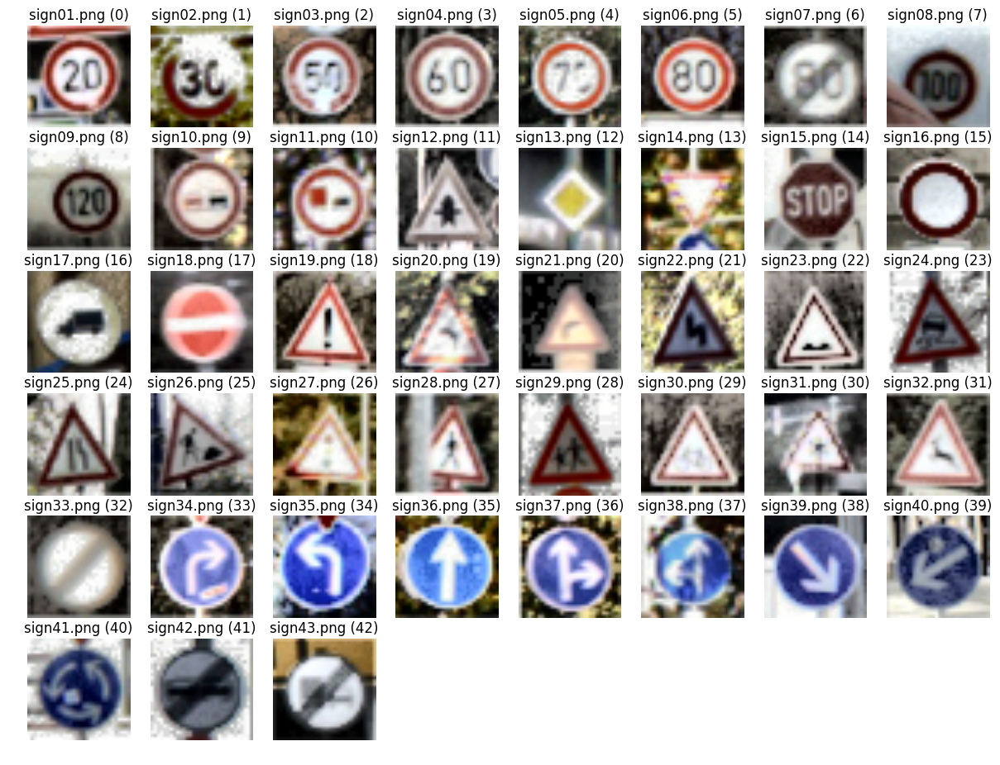

In [32]:
### Load the images and plot them here.

import os
import matplotlib.image as mpimg
#from PIL import Image
from scipy.ndimage.io import imread

filelist = os.listdir("./pics-traffic-signs/")
filelist.sort()

images_new = []
labels_new = []
i=1
for file in filelist:
    img = imread('./pics-traffic-signs/' + file, mode='RGB')
    #img = Image.open('./pics-traffic-signs/' + file)
    #img = cv2.imread('./pics-traffic-signs' + file, cv2.IMREAD_UNCHANGED)
    #image = cv2.resize(img, (32, 32))
    image = cv2.resize(np.asarray(img), (32, 32))
    images_new.append(image)
    
    #labels
    labels_new.append(i-1)
    i=i+1
    
X_new = np.asarray(images_new)
y_new = np.asarray(labels_new)

print(X_new.shape)
#X_new = X_new[:,:,:,1:4] # in case of 4-channel png files

if (proc_num_channels==1):
    ## Pre-Process: Grayscale
    X_new_prep = preprocess_grayscale(X_new)
elif (proc_num_channels==3):
    ## Pre-Process: RGB
    X_new_prep = preprocess_rgb(X_new)
else:
    print('Please select ONLY 1 or 3 channels')
   
plt.figure(figsize=(15, 15))
for i in range(X_new.shape[0]):
    plt.subplot(8, 8, i+1)
    plt.axis('off')
    plt.title('{} ({})'.format(filelist[i], y_new[i]))
    img = X_new_prep[i]
    if(img.shape[2]==3):
        plt.imshow(img.squeeze()) 
    else:
        plt.imshow(img.squeeze(), cmap="gray")

plt.show()

The second set is another contact sheet (source: http://fxgallery.com/german-highway-signs.html) consisting of other traffic signs that may or may not be similar to the German traffic signs.


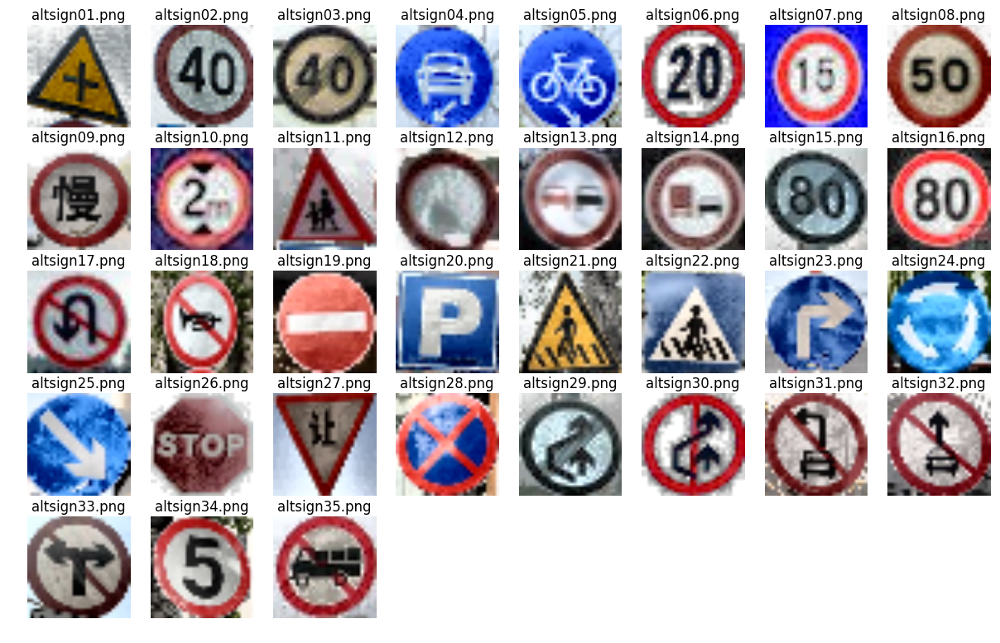

In [33]:
filelist = os.listdir("./pics-alt-signs/")
filelist.sort()

images_new = []
for file in filelist:
    img = imread('./pics-alt-signs/' + file, mode='RGB')
    #img = Image.open('./pics-alt-signs/' + file)
    image = cv2.resize(np.asarray(img), (32, 32))
    images_new.append(image)
    
X_alt = np.asarray(images_new)
      
if (proc_num_channels==1):
    ## Pre-Process: Grayscale
    X_alt_prep = preprocess_grayscale(X_alt)
elif (proc_num_channels==3):
    ## Pre-Process: RGB
    X_alt_prep = preprocess_rgb(X_alt)
else:
    print('Please select ONLY 1 or 3 channels')
   
plt.figure(figsize=(15, 15))
for i in range(X_alt.shape[0]):
    plt.subplot(8, 8, i+1)
    plt.axis('off')
    plt.title('{}'.format(filelist[i]))
    img = X_alt_prep[i]
    if(img.shape[2]==3):
        plt.imshow(img.squeeze()) 
    else:
        plt.imshow(img.squeeze(), cmap="gray")

plt.show()

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._



**Answer:**

Set 1: 

I've chosen 6 to highlight in the report.

The first two have severe glare issues, which may affect classification accuracy. It would likely reduce classification accuracies in human.

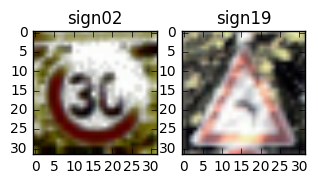

In [45]:
plt.figure(figsize=(15, 15))
plt.axis('off')
plt.subplot(8, 8, 1)
plt.title('sign02')
plt.imshow(X_new[1].squeeze()) 
plt.subplot(8, 8, 2)
plt.title('sign19')
plt.imshow(X_new[19].squeeze()) 

plt.show()

The next two have partial obstruction, which obscure/remove some information about the original signs.

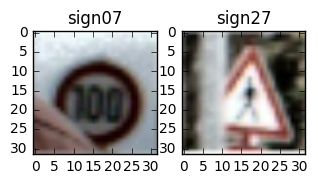

In [43]:
plt.figure(figsize=(15, 15))
plt.axis('off')
plt.subplot(8, 8, 1)
plt.title('sign07')
plt.imshow(X_new[7].squeeze()) 
plt.subplot(8, 8, 2)
plt.title('sign27')
plt.imshow(X_new[27].squeeze()) 

plt.show()

The last two are slightly rotated. If rotated images are not represented in the training set, it might cause a problem in test accuracy.

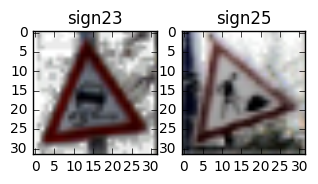

In [44]:
plt.figure(figsize=(15, 15))
plt.axis('off')
plt.subplot(8, 8, 1)
plt.title('sign23')
plt.imshow(X_new[23].squeeze()) 
plt.subplot(8, 8, 2)
plt.title('sign25')
plt.imshow(X_new[25].squeeze()) 

plt.show()

For set 2, since the signs are mostly not German traffic signs, accuracy of the classification are not relevant since they have not been trained at all, and we do not have enough information about the nearest corresponding german sign. 

### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


In [46]:
### Run the predictions for new German traffic signs (source: http://www.embedded-vision.com/platinum-members/cadence/embedded-vision-training/documents/pages/neuralnetworksimagerecognition)
X_new = X_new_prep

# test accuracy
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    test_accuracy = evaluate(X_new, y_new, 1.0)
    print("Test Accuracy = {:.3f}".format(test_accuracy))

Test Accuracy = 1.000


**Answer:**

Suprisingly, our model is able to detect all the traffic signs correctly, even for the problem cases listed above.

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

Image 0:
0: Speed limit (20km/h) (confidence 1.000)
1: Speed limit (30km/h) (confidence 0.000)
8: Speed limit (120km/h) (confidence 0.000)


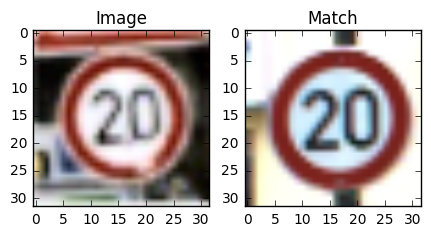

Image 1:
1: Speed limit (30km/h) (confidence 1.000)
21: Double curve (confidence 0.000)
2: Speed limit (50km/h) (confidence 0.000)


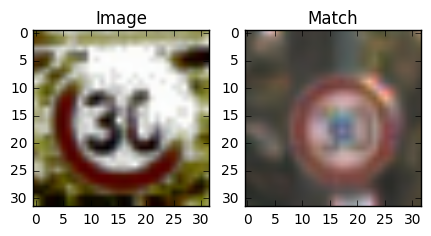

Image 2:
2: Speed limit (50km/h) (confidence 1.000)
5: Speed limit (80km/h) (confidence 0.000)
7: Speed limit (100km/h) (confidence 0.000)


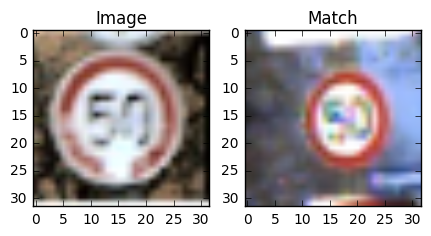

Image 3:
3: Speed limit (60km/h) (confidence 1.000)
5: Speed limit (80km/h) (confidence 0.000)
23: Slippery road (confidence 0.000)


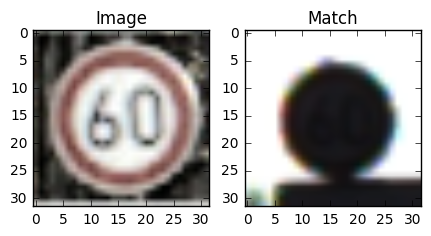

Image 4:
4: Speed limit (70km/h) (confidence 1.000)
1: Speed limit (30km/h) (confidence 0.000)
0: Speed limit (20km/h) (confidence 0.000)


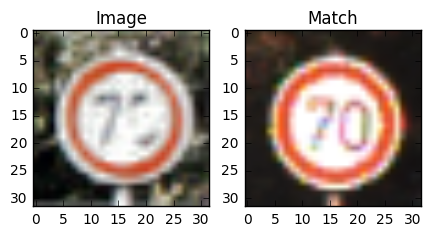

Image 5:
5: Speed limit (80km/h) (confidence 1.000)
3: Speed limit (60km/h) (confidence 0.000)
2: Speed limit (50km/h) (confidence 0.000)


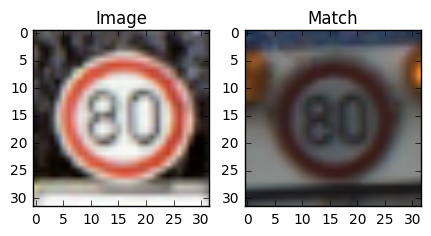

Image 6:
6: End of speed limit (80km/h) (confidence 1.000)
42: End of no passing by vehicles over 3.5 metric tons (confidence 0.000)
32: End of all speed and passing limits (confidence 0.000)


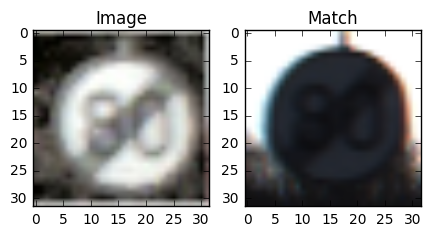

Image 7:
7: Speed limit (100km/h) (confidence 0.983)
8: Speed limit (120km/h) (confidence 0.012)
16: Vehicles over 3.5 metric tons prohibited (confidence 0.004)


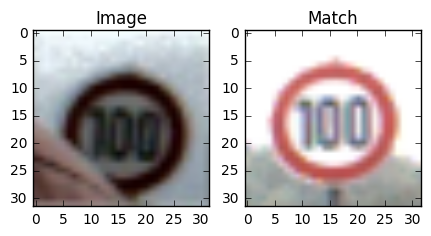

Image 8:
8: Speed limit (120km/h) (confidence 1.000)
7: Speed limit (100km/h) (confidence 0.000)
15: No vehicles (confidence 0.000)


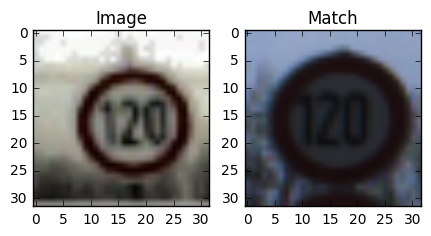

Image 9:
9: No passing (confidence 1.000)
10: No passing for vehicles over 3.5 metric tons (confidence 0.000)
16: Vehicles over 3.5 metric tons prohibited (confidence 0.000)


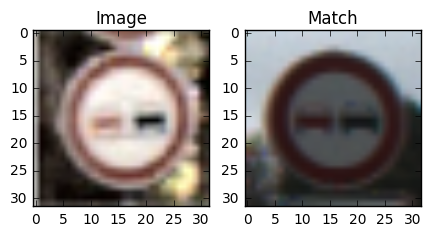

Image 10:
10: No passing for vehicles over 3.5 metric tons (confidence 1.000)
5: Speed limit (80km/h) (confidence 0.000)
9: No passing (confidence 0.000)


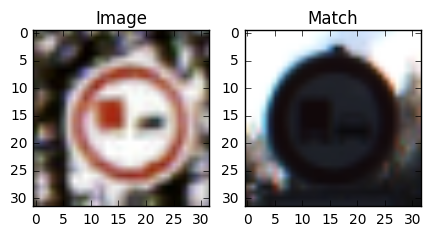

Image 11:
11: Right-of-way at the next intersection (confidence 1.000)
30: Beware of ice/snow (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


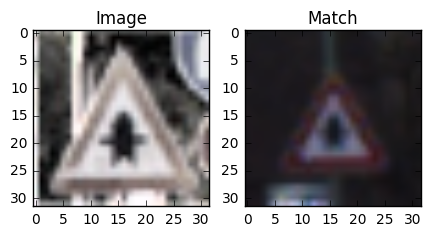

Image 12:
12: Priority road (confidence 1.000)
42: End of no passing by vehicles over 3.5 metric tons (confidence 0.000)
0: Speed limit (20km/h) (confidence 0.000)


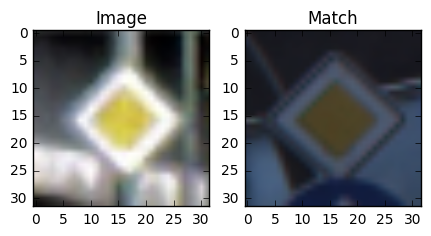

Image 13:
13: Yield (confidence 1.000)
33: Turn right ahead (confidence 0.000)
39: Keep left (confidence 0.000)


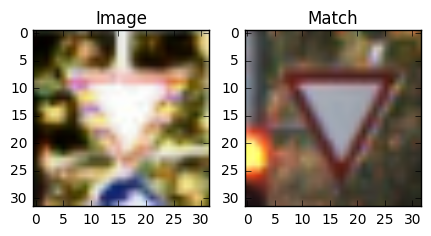

Image 14:
14: Stop (confidence 1.000)
13: Yield (confidence 0.000)
12: Priority road (confidence 0.000)


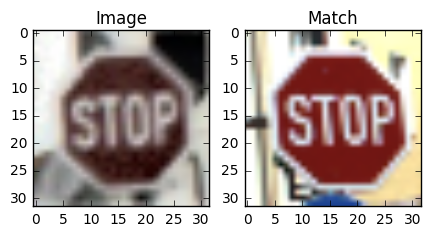

Image 15:
15: No vehicles (confidence 1.000)
9: No passing (confidence 0.000)
13: Yield (confidence 0.000)


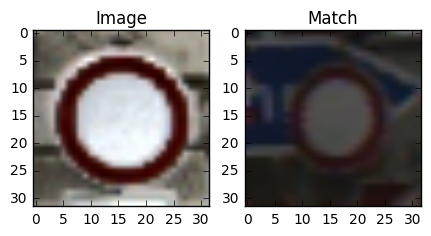

Image 16:
16: Vehicles over 3.5 metric tons prohibited (confidence 1.000)
41: End of no passing (confidence 0.000)
20: Dangerous curve to the right (confidence 0.000)


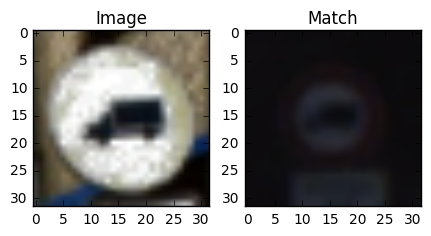

Image 17:
17: No entry (confidence 1.000)
14: Stop (confidence 0.000)
32: End of all speed and passing limits (confidence 0.000)


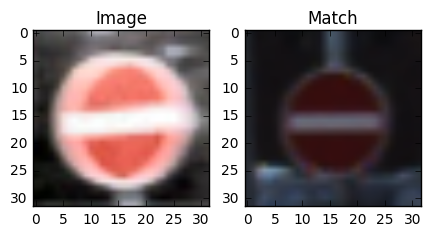

Image 18:
18: General caution (confidence 1.000)
26: Traffic signals (confidence 0.000)
40: Roundabout mandatory (confidence 0.000)


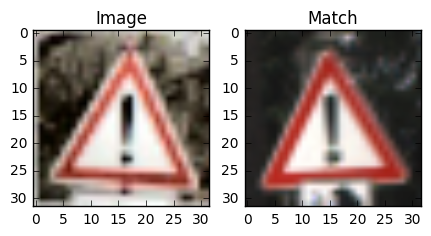

Image 19:
19: Dangerous curve to the left (confidence 1.000)
23: Slippery road (confidence 0.000)
2: Speed limit (50km/h) (confidence 0.000)


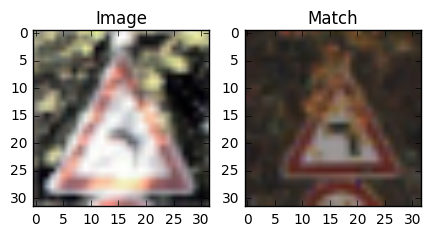

Image 20:
20: Dangerous curve to the right (confidence 1.000)
23: Slippery road (confidence 0.000)
41: End of no passing (confidence 0.000)


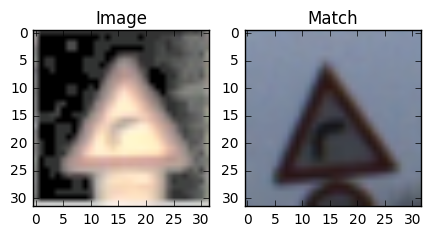

Image 21:
21: Double curve (confidence 1.000)
19: Dangerous curve to the left (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


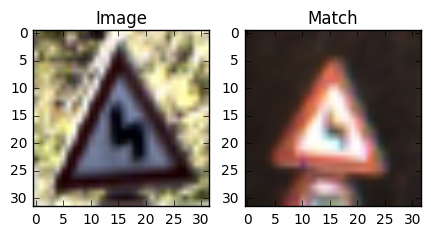

Image 22:
22: Bumpy road (confidence 1.000)
25: Road work (confidence 0.000)
29: Bicycles crossing (confidence 0.000)


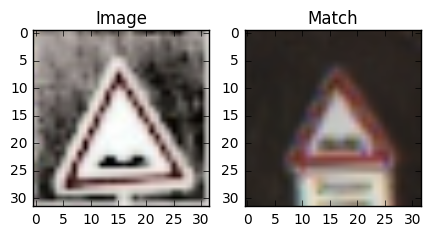

Image 23:
23: Slippery road (confidence 1.000)
19: Dangerous curve to the left (confidence 0.000)
28: Children crossing (confidence 0.000)


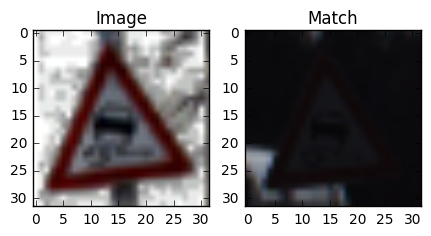

Image 24:
24: Road narrows on the right (confidence 1.000)
27: Pedestrians (confidence 0.000)
28: Children crossing (confidence 0.000)


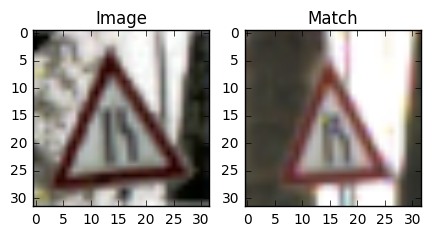

Image 25:
25: Road work (confidence 1.000)
24: Road narrows on the right (confidence 0.000)
29: Bicycles crossing (confidence 0.000)


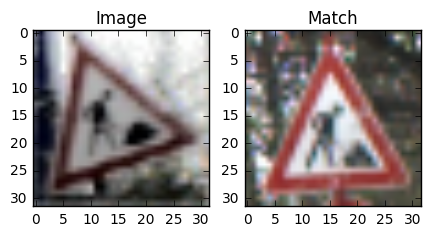

Image 26:
26: Traffic signals (confidence 1.000)
20: Dangerous curve to the right (confidence 0.000)
22: Bumpy road (confidence 0.000)


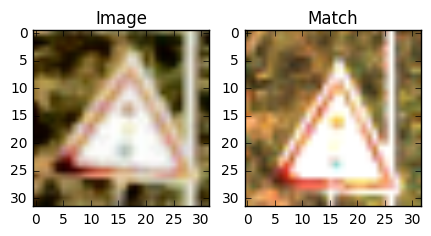

Image 27:
27: Pedestrians (confidence 0.999)
11: Right-of-way at the next intersection (confidence 0.001)
7: Speed limit (100km/h) (confidence 0.000)


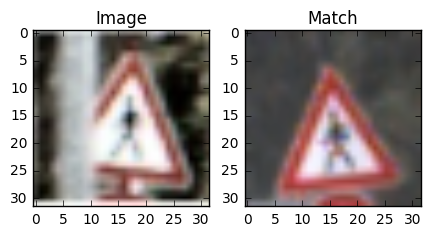

Image 28:
28: Children crossing (confidence 1.000)
29: Bicycles crossing (confidence 0.000)
3: Speed limit (60km/h) (confidence 0.000)


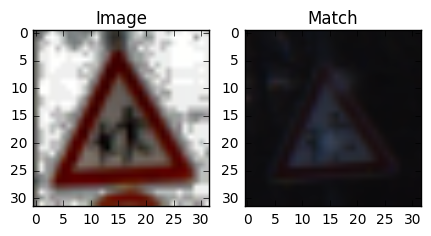

Image 29:
29: Bicycles crossing (confidence 1.000)
20: Dangerous curve to the right (confidence 0.000)
24: Road narrows on the right (confidence 0.000)


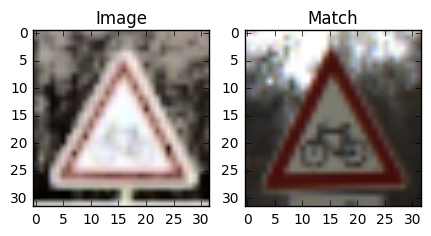

Image 30:
30: Beware of ice/snow (confidence 0.998)
11: Right-of-way at the next intersection (confidence 0.002)
23: Slippery road (confidence 0.000)


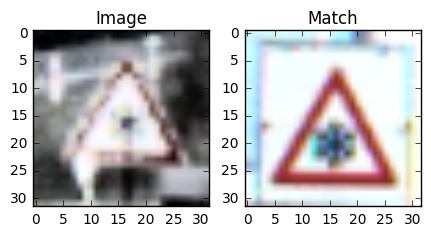

Image 31:
31: Wild animals crossing (confidence 1.000)
21: Double curve (confidence 0.000)
39: Keep left (confidence 0.000)


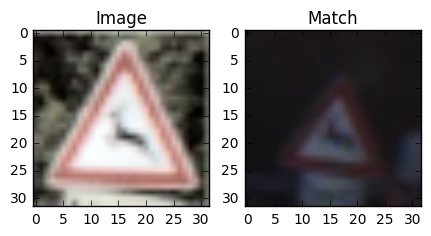

Image 32:
32: End of all speed and passing limits (confidence 1.000)
41: End of no passing (confidence 0.000)
6: End of speed limit (80km/h) (confidence 0.000)


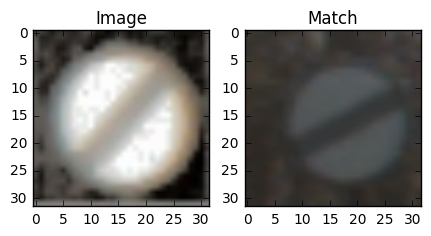

Image 33:
33: Turn right ahead (confidence 1.000)
39: Keep left (confidence 0.000)
12: Priority road (confidence 0.000)


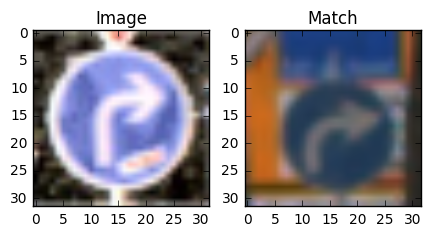

Image 34:
34: Turn left ahead (confidence 1.000)
38: Keep right (confidence 0.000)
40: Roundabout mandatory (confidence 0.000)


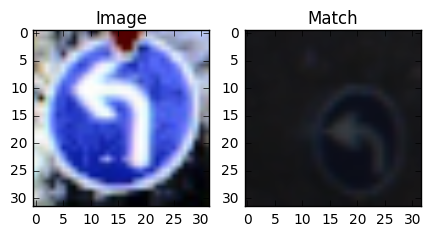

Image 35:
35: Ahead only (confidence 1.000)
34: Turn left ahead (confidence 0.000)
33: Turn right ahead (confidence 0.000)


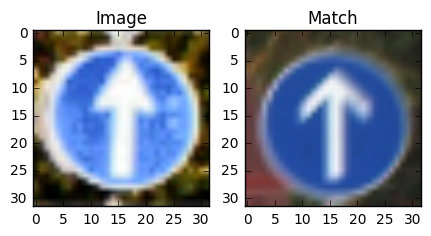

Image 36:
36: Go straight or right (confidence 1.000)
3: Speed limit (60km/h) (confidence 0.000)
32: End of all speed and passing limits (confidence 0.000)


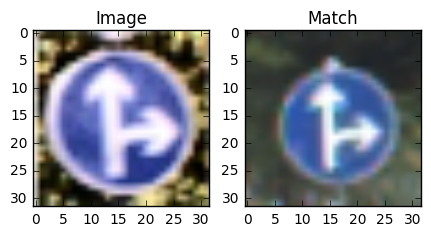

Image 37:
37: Go straight or left (confidence 1.000)
39: Keep left (confidence 0.000)
40: Roundabout mandatory (confidence 0.000)


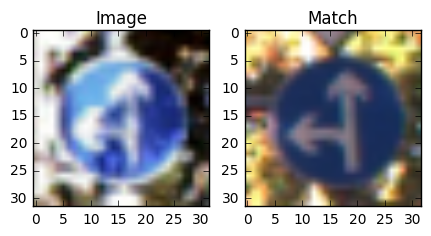

Image 38:
38: Keep right (confidence 1.000)
13: Yield (confidence 0.000)
3: Speed limit (60km/h) (confidence 0.000)


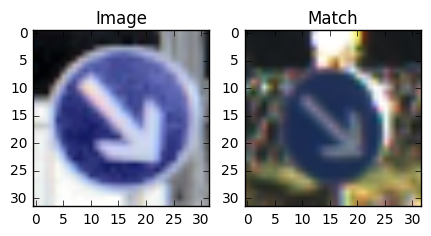

Image 39:
39: Keep left (confidence 1.000)
15: No vehicles (confidence 0.000)
13: Yield (confidence 0.000)


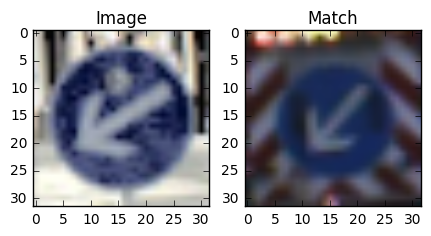

Image 40:
40: Roundabout mandatory (confidence 1.000)
37: Go straight or left (confidence 0.000)
39: Keep left (confidence 0.000)


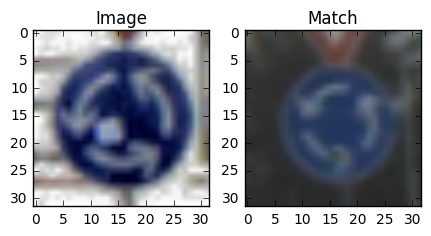

Image 41:
41: End of no passing (confidence 1.000)
32: End of all speed and passing limits (confidence 0.000)
20: Dangerous curve to the right (confidence 0.000)


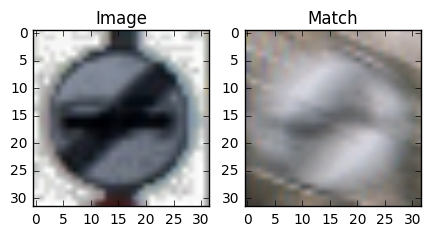

Image 42:
42: End of no passing by vehicles over 3.5 metric tons (confidence 1.000)
6: End of speed limit (80km/h) (confidence 0.000)
41: End of no passing (confidence 0.000)


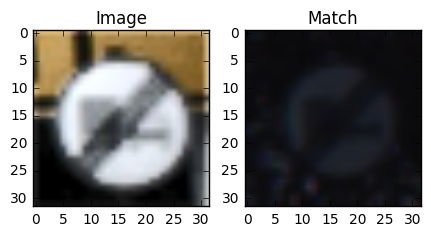

In [35]:
## Set 1

feed_dict = {x: X_new, keep_prob: 1}
k_top = 5

with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))
    softmax_operation = tf.nn.softmax(logits)    
    top_k_prob = sess.run(tf.nn.top_k(softmax_operation, k_top), feed_dict=feed_dict)      

    
for i in range(X_new.shape[0]):
    img = X_new[i]
    
    #print("Image %i: %-*s  confidence %s" % (i, signnames[predict], str(top_k_prob.values[i][0])))
    print("Image {}:".format(i))

    for k in range(3):
        predict = top_k_prob.indices[i][k]
        print("{}: {} (confidence {:.3f})".format(predict, signnames[predict], (top_k_prob.values[i][k])))
    
    plt.figure(figsize=(5,5))

    plt.subplot(1, 2, 1)
    plt.imshow(img.squeeze(),cmap="gray")
    plt.title("Image")

    plt.subplot(1, 2, 2)
    plt.imshow(X_samples[top_k_prob.indices[i][0]].squeeze())
    plt.title("Match")

    plt.show()

**Answer:**

For Set 1: 

From the above, we see that for most cases, the softmax probabilities for the correct sign is almost 1.0 (worst case was 0.98). This means the correct classification was done with very high confidence.


Next we look at how the model classify alternate traffic signs in set 2.

(43, 32, 32, 3)
Image 0:
12: Priority road (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


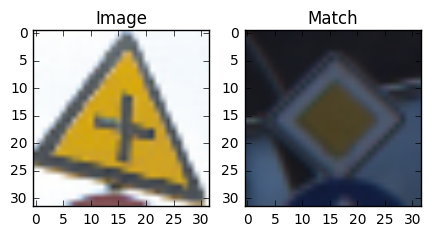

Image 1:
34: Turn left ahead (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


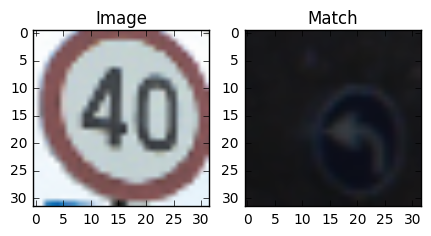

Image 2:
5: Speed limit (80km/h) (confidence 1.000)
6: End of speed limit (80km/h) (confidence 0.000)
0: Speed limit (20km/h) (confidence 0.000)


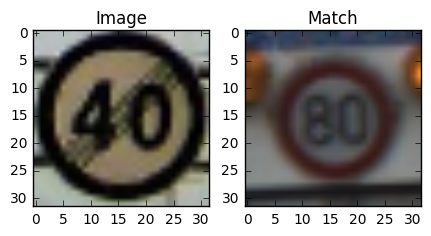

Image 3:
40: Roundabout mandatory (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


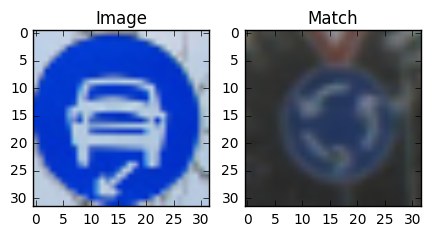

Image 4:
40: Roundabout mandatory (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


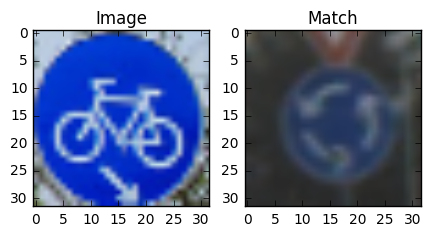

Image 5:
35: Ahead only (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


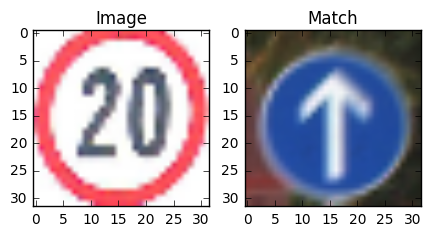

Image 6:
2: Speed limit (50km/h) (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


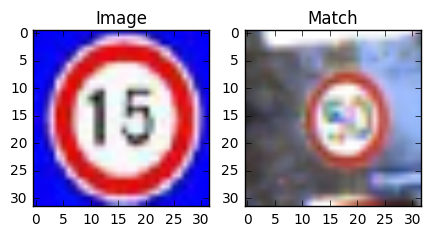

Image 7:
5: Speed limit (80km/h) (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


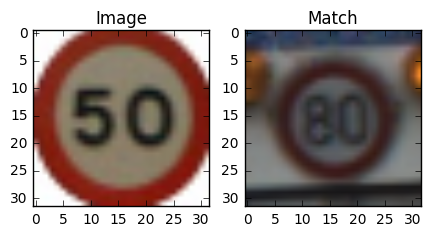

Image 8:
1: Speed limit (30km/h) (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
2: Speed limit (50km/h) (confidence 0.000)


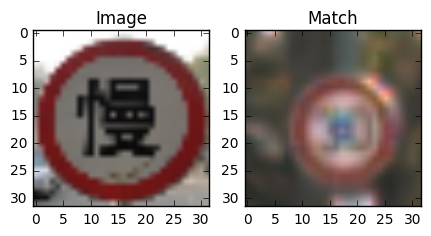

Image 9:
28: Children crossing (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


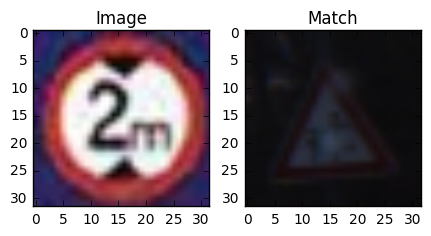

Image 10:
11: Right-of-way at the next intersection (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


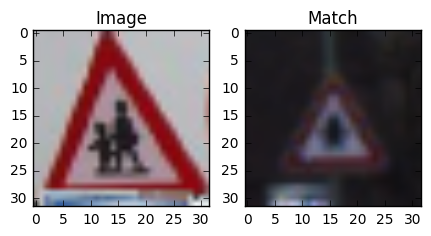

Image 11:
33: Turn right ahead (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


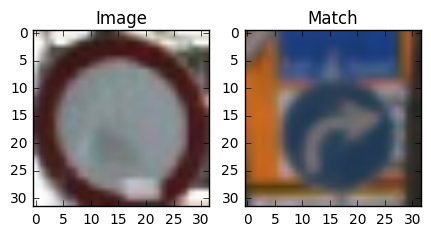

Image 12:
12: Priority road (confidence 0.997)
41: End of no passing (confidence 0.003)
0: Speed limit (20km/h) (confidence 0.000)


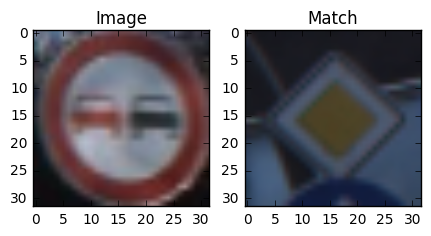

Image 13:
10: No passing for vehicles over 3.5 metric tons (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


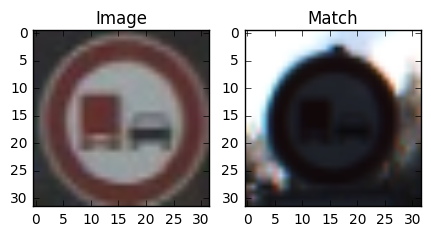

Image 14:
5: Speed limit (80km/h) (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


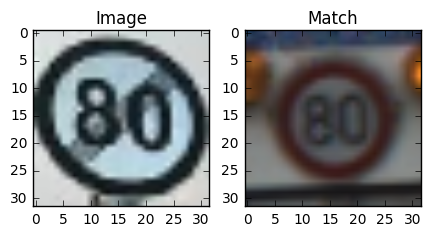

Image 15:
2: Speed limit (50km/h) (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


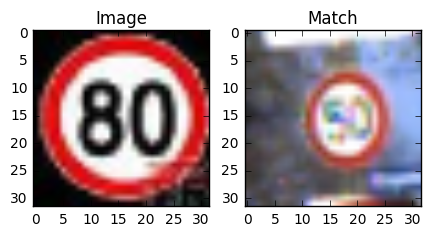

Image 16:
36: Go straight or right (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


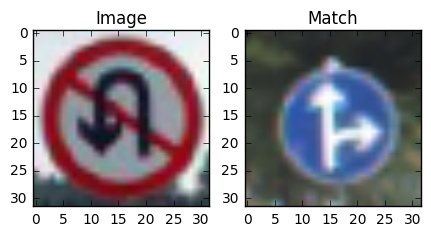

Image 17:
7: Speed limit (100km/h) (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


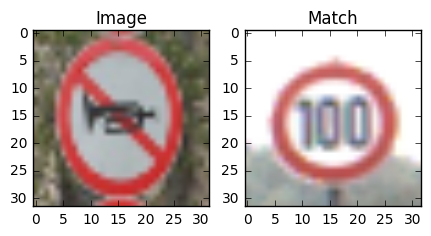

Image 18:
17: No entry (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


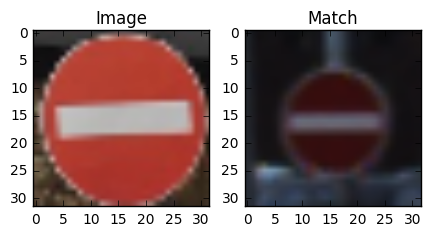

Image 19:
33: Turn right ahead (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


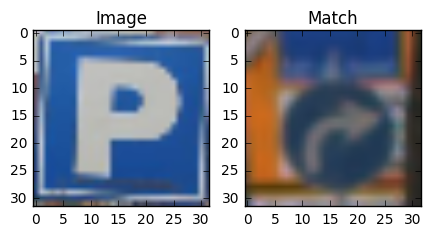

Image 20:
21: Double curve (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


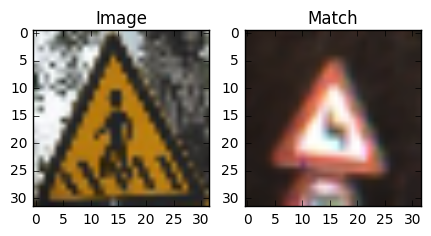

Image 21:
11: Right-of-way at the next intersection (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


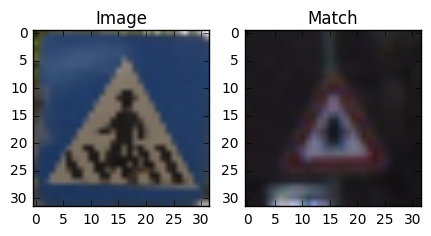

Image 22:
33: Turn right ahead (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


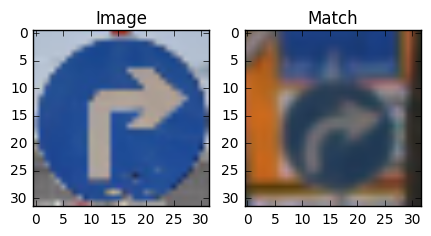

Image 23:
33: Turn right ahead (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


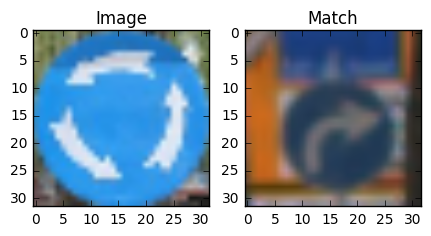

Image 24:
38: Keep right (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


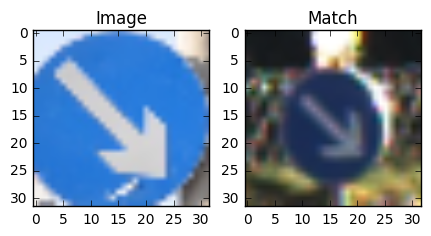

Image 25:
13: Yield (confidence 1.000)
39: Keep left (confidence 0.000)
0: Speed limit (20km/h) (confidence 0.000)


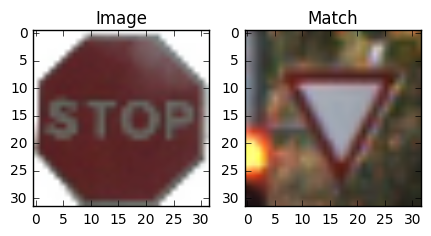

Image 26:
13: Yield (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


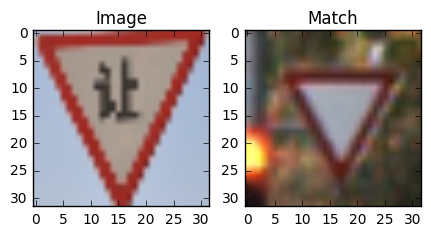

Image 27:
33: Turn right ahead (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


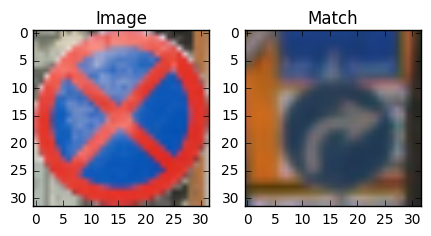

Image 28:
16: Vehicles over 3.5 metric tons prohibited (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


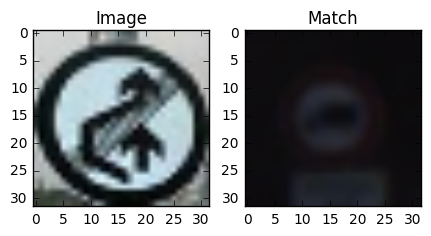

Image 29:
20: Dangerous curve to the right (confidence 1.000)
34: Turn left ahead (confidence 0.000)
0: Speed limit (20km/h) (confidence 0.000)


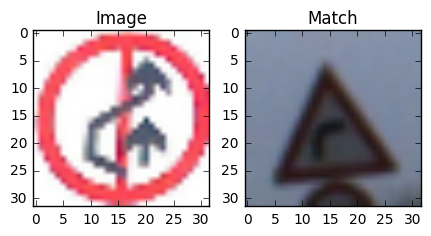

Image 30:
8: Speed limit (120km/h) (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


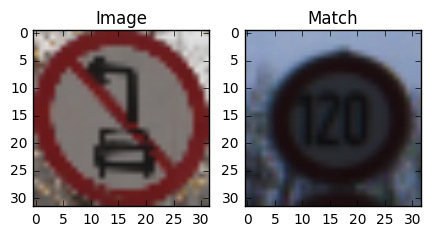

Image 31:
7: Speed limit (100km/h) (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


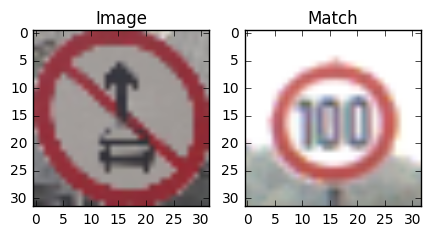

Image 32:
11: Right-of-way at the next intersection (confidence 1.000)
27: Pedestrians (confidence 0.000)
0: Speed limit (20km/h) (confidence 0.000)


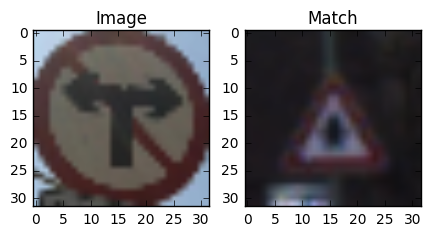

Image 33:
8: Speed limit (120km/h) (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


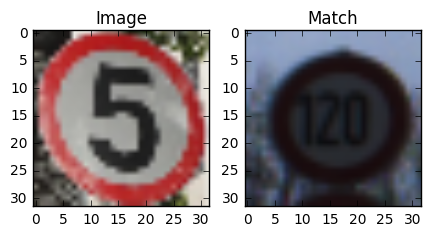

Image 34:
9: No passing (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


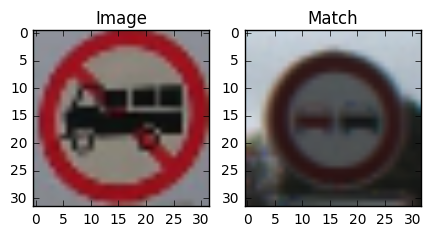

In [47]:
### Visualize the softmax probabilities here.
### Feel free to use as many code cells as needed.
X_samples = np.asarray(X_samples)
print(X_samples.shape)

feed_dict = {x: X_alt, keep_prob: 1}
k_top = 5

with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))
    softmax_operation = tf.nn.softmax(logits)    
    top_k_prob = sess.run(tf.nn.top_k(softmax_operation, k_top), feed_dict=feed_dict)      

    
for i in range(X_alt.shape[0]):
    img = X_alt[i]
    
    #print("Image %i: %-*s  confidence %s" % (i, signnames[predict], str(top_k_prob.values[i][0])))
    print("Image {}:".format(i))

    for k in range(3):
        predict = top_k_prob.indices[i][k]
        print("{}: {} (confidence {:.3f})".format(predict, signnames[predict], (top_k_prob.values[i][k])))
    
    plt.figure(figsize=(5,5))

    plt.subplot(1, 2, 1)
    plt.imshow(img.squeeze())
    plt.title("Image")

    plt.subplot(1, 2, 2)
#    plt.imshow(X_new[top_k_prob.indices[i][0]].squeeze(),cmap="gray")
    plt.imshow(X_samples[top_k_prob.indices[i][0]].squeeze())
    plt.title("Match")

    plt.show()
    
#print(top_k_prob.values[18])
#print(top_k_prob.indices[18])

#print(top_k_prob.values[11])
#print(top_k_prob.indices[11])

**Answer:**

For set 2, as expected, most of the images are not classified as something close. However, we can see some interesting results.

Image 0:
12: Priority road (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


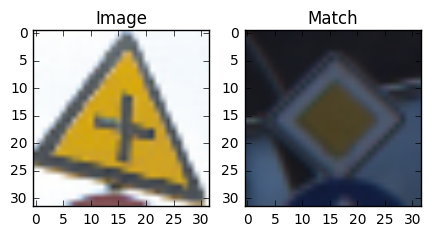

In [56]:
i=0

print("Image {}:".format(i))

for k in range(3):
    predict = top_k_prob.indices[i][k]
    print("{}: {} (confidence {:.3f})".format(predict, signnames[predict], (top_k_prob.values[i][k])))

img = X_alt[i]

plt.figure(figsize=(5,5))

plt.subplot(1, 2, 1)
plt.imshow(img.squeeze())
plt.title("Image")

plt.subplot(1, 2, 2)
plt.imshow(X_samples[top_k_prob.indices[i][0]].squeeze())
plt.title("Match")

plt.show()


1. Since image colors were preserved (instead of gray scale), the model was able to match an unknown sign above to one of the same color.

Image 8:
1: Speed limit (30km/h) (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
2: Speed limit (50km/h) (confidence 0.000)


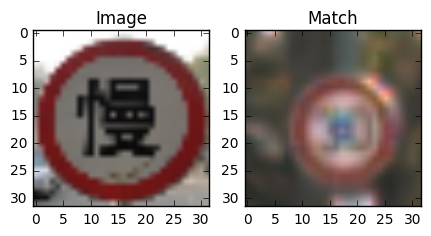

In [57]:
i=8

print("Image {}:".format(i))

for k in range(3):
    predict = top_k_prob.indices[i][k]
    print("{}: {} (confidence {:.3f})".format(predict, signnames[predict], (top_k_prob.values[i][k])))

img = X_alt[i]

plt.figure(figsize=(5,5))

plt.subplot(1, 2, 1)
plt.imshow(img.squeeze())
plt.title("Image")

plt.subplot(1, 2, 2)
plt.imshow(X_samples[top_k_prob.indices[i][0]].squeeze())
plt.title("Match")

plt.show()


The above chinese character for "slow" is identified as 30 km/h limit, which is kind of slow.

Image 26:
13: Yield (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


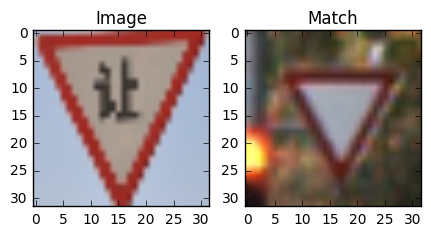

In [58]:
i=26

print("Image {}:".format(i))

for k in range(3):
    predict = top_k_prob.indices[i][k]
    print("{}: {} (confidence {:.3f})".format(predict, signnames[predict], (top_k_prob.values[i][k])))

img = X_alt[i]

plt.figure(figsize=(5,5))

plt.subplot(1, 2, 1)
plt.imshow(img.squeeze())
plt.title("Image")

plt.subplot(1, 2, 2)
plt.imshow(X_samples[top_k_prob.indices[i][0]].squeeze())
plt.title("Match")

plt.show()


Another chinese character for "yield" was correctly classified as a "yield" sign.

Image 34:
9: No passing (confidence 1.000)
0: Speed limit (20km/h) (confidence 0.000)
1: Speed limit (30km/h) (confidence 0.000)


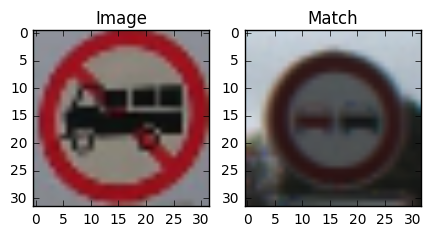

In [60]:
i=34

print("Image {}:".format(i))

for k in range(3):
    predict = top_k_prob.indices[i][k]
    print("{}: {} (confidence {:.3f})".format(predict, signnames[predict], (top_k_prob.values[i][k])))

img = X_alt[i]

plt.figure(figsize=(5,5))

plt.subplot(1, 2, 1)
plt.imshow(img.squeeze())
plt.title("Image")

plt.subplot(1, 2, 2)
plt.imshow(X_samples[top_k_prob.indices[i][0]].squeeze())
plt.title("Match")

plt.show()


This may not be what it means, but a match to "No Passing" might be a mistake a human would make.

## Conclusion

In this project, we successfully use deep learning to design and implement a convolutional neural networks to classify German traffic signs with very high accuracy (>94%). The deep learning model implemented was able to successfully classify signs that are simiilar to those it has observed before, while choosing a close match for unknown signs.